<a href="https://colab.research.google.com/github/nssingh-ml/tifr/blob/main/Unet_model_with_Hyperparameter_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Kaggle dataset loader set

In [ ]:
!pip install kaggle

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle

cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
!kaggle datasets list

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.10/dist-packages/kaggle/__init__.py", line 7, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.10/dist-packages/kaggle/api/kaggle_api_extended.py", line 398, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [ ]:
!kaggle datasets download -d mateuszbuda/lgg-mri-segmentation

Dataset URL: https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation
License(s): CC-BY-NC-SA-4.0
100% 712M/714M [00:32<00:00, 22.1MB/s]
100% 714M/714M [00:32<00:00, 22.7MB/s]


In [ ]:
!unzip lgg-mri-segmentation.zip

Streaming output truncated to the last 5000 lines.
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7294_19890104/TCGA_DU_7294_19890104_9_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_1.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_13.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_1

### Connecting to Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# import os
# save_dir = '/content/drive/My Drive/tifr_notebook/kaggle_3m'
# os.makedirs(save_dir, exist_ok=True)

In [ ]:
# !cp -r kaggle_3m '/content/drive/My Drive/tifr_notebook/kaggle_3m'

### Dataset

In [ ]:
import glob
# Make objects with the images and masks.
brain_scans = []
dataset_path = "/content/kaggle_3m/"
mask_files = glob.glob(dataset_path + '*/*_mask*')
# mask_files = glob.glob('../kaggle/lgg-mri-segmentation/kaggle_3m/*/*_mask*')

for i in mask_files:
    brain_scans.append(i.replace('_mask',''))

print(brain_scans[:10])
print(mask_files[:10])

['/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_12.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_1.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_11.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_18.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_8.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_7.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_16.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_13.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_17.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_14.tif']
['/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_12_mask.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_1_mask.tif', '/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_HT_7874_19950902_11_mask.tif', '/content/kaggle_3m/TCGA_HT_7874_19950

In [ ]:
import pandas as pd
img_df = pd.DataFrame({
    "image_path":brain_scans,
    "mask_path":mask_files
})

In [ ]:
import cv2
import numpy as np
def positive_negative_diagnosis(file_masks):
    mask = cv2.imread(file_masks)
    value = np.max(mask)
    if value > 0:
        return 1
    else:
        return 0

# Apply the function to the masks and return back a column with 1 and zeros, where 0 indicate no tumor and 1 a tumor.
img_df["Tumor"] = img_df["mask_path"].apply(lambda x: positive_negative_diagnosis(x))

In [ ]:
img_df

,image_path,mask_path,Tumor
0,/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_...,/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_...,1
1,/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_...,/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_...,0
2,/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_...,/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_...,1
3,/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_...,/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_...,0
4,/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_...,/content/kaggle_3m/TCGA_HT_7874_19950902/TCGA_...,1
...,...,...,...
3924,/content/kaggle_3m/TCGA_CS_5393_19990606/TCGA_...,/content/kaggle_3m/TCGA_CS_5393_19990606/TCGA_...,0
3925,/content/kaggle_3m/TCGA_CS_5393_19990606/TCGA_...,/content/kaggle_3m/TCGA_CS_5393_19990606/TCGA_...,0
3926,/content/kaggle_3m/TCGA_CS_5393_19990606/TCGA_...,/content/kaggle_3m/TCGA_CS_5393_19990606/TCGA_...,1
3927,/content/kaggle_3m/TCGA_CS_5393_19990606/TCGA_...,/content/kaggle_3m/TCGA_CS_5393_19990606/TCGA_...,0


In [ ]:
img_df["Tumor"].value_counts()

Tumor
0    2556
1    1373
Name: count, dtype: int64

In [ ]:
# import matplotlib.pyplot as plt

# for i in range(1,40, 2):
#     img_path=brain_scans[i]
#     msk_path=mask_files[i]
#     img=cv2.imread(img_path)
#     img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
#     msk=cv2.imread(msk_path)

#     #Plot the Brain MRI scans
#     original = img.copy()
#     fig, ax = plt.subplots(1,3,figsize = (15,5))
#     ax[0].imshow(original)
#     ax[0].set_title("Brain MRI")

#     # Plot the corresponding mask
#     main = original.copy()
#     mask = msk.copy()
#     ax[1].imshow(mask)
#     ax[1].set_title("Tumor Location")

#     # Plot the Brain MRI scan with their mask
#     main = original.copy()
#     label = cv2.imread(msk_path)
#     sample = np.array(np.squeeze(label), dtype = np.uint8)
#     contours, hier = cv2.findContours(sample[:,:,0],cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
#     sample_over_gt = cv2.drawContours(main, contours, -1,[255,0,0], thickness=-1)
#     ax[2].imshow(sample_over_gt)
#     ax[2].set_title("MRI Brain with highlighted Tumor")

In [ ]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(img_df[:3000],test_size = 0.1)
train, val = train_test_split(train,test_size = 0.2)
print(train.values.shape)
print(val.values.shape)
print(test.values.shape)

train.head()
val.head()

(2160, 3)
(540, 3)
(300, 3)


,image_path,mask_path,Tumor
1526,/content/kaggle_3m/TCGA_DU_8162_19961029/TCGA_...,/content/kaggle_3m/TCGA_DU_8162_19961029/TCGA_...,0
586,/content/kaggle_3m/TCGA_DU_8164_19970111/TCGA_...,/content/kaggle_3m/TCGA_DU_8164_19970111/TCGA_...,1
2429,/content/kaggle_3m/TCGA_DU_6404_19850629/TCGA_...,/content/kaggle_3m/TCGA_DU_6404_19850629/TCGA_...,0
1632,/content/kaggle_3m/TCGA_DU_7018_19911220/TCGA_...,/content/kaggle_3m/TCGA_DU_7018_19911220/TCGA_...,1
1595,/content/kaggle_3m/TCGA_DU_5854_19951104/TCGA_...,/content/kaggle_3m/TCGA_DU_5854_19951104/TCGA_...,0


In [ ]:
img_df['Tumor'] = img_df['Tumor'].apply(lambda x: str(x))
img_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   Tumor       3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


### Data Augmentation

In [ ]:
from keras.preprocessing.image import ImageDataGenerator


def train_generator(data_frame, batch_size, aug_dict,
        image_color_mode="rgb",
        mask_color_mode="grayscale",
        image_save_prefix="image",
        mask_save_prefix="mask",
        save_to_dir=None,
        target_size=(128,128),
        seed=1):
    '''
    can generate image and mask at the same time use the same seed for
    image_datagen and mask_datagen to ensure the transformation for image
    and mask is the same if you want to visualize the results of generator,
    set save_to_dir = "your path"
    '''
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)

    image_generator = image_datagen.flow_from_dataframe(
        data_frame,
        x_col = "image_path",
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)

    mask_generator = mask_datagen.flow_from_dataframe(
        data_frame,
        x_col = "mask_path",
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)

    train_gen = zip(image_generator, mask_generator)

    for (img, mask) in train_gen:
        img, mask = adjust_data(img, mask)
        yield (img,mask)

def adjust_data(img,mask):
    img = img / 127
    mask = mask / 127
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0

    return (img, mask)

### Hyperparameters

In [ ]:
EPOCHS = 30
BATCH_SIZE = 32
im_height = 128
im_width = 128

In [ ]:
train_generator_args = dict(width_shift_range=0.05,
                            height_shift_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            fill_mode='nearest'
                           )


train_gen = train_generator(train, BATCH_SIZE,
                            train_generator_args,
                            target_size=(im_height,
                            im_width)
                           )


test_gen = train_generator(val, BATCH_SIZE,
                            dict(),
                            target_size=(im_height, im_width)
                            )

### Loss Function

In [ ]:
from tensorflow import keras
import tensorflow.keras.backend as K
smooth=100

def dice_coef(y_true, y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)
    And=K.sum(y_truef* y_predf)
    return((2* And + smooth) / (K.sum(y_truef) + K.sum(y_predf) + smooth))

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

def iou(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def jac_distance(y_true, y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)

    return - iou(y_true, y_pred)

# Model and Variations

In [ ]:
import os
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler

# Unet

In [ ]:
save_dir = '/content/drive/My Drive/tifr_notebook/unet'
os.makedirs(save_dir, exist_ok=True)

## Unet base Model

In [ ]:
save_dir = '/content/drive/My Drive/tifr_notebook/unet/base_model'
os.makedirs(save_dir, exist_ok=True)

In [ ]:
def unet(input_size=(128,128,3)):

    inputs = Input(input_size)

    # Stage 1
    conv1 = Conv2D(64, (3, 3), padding='same')(inputs)
    bn1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation('relu')(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    # Stage 2
    conv2 = Conv2D(128, (3, 3), padding='same')(pool1)
    bn2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation('relu')(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    # Stage 3
    conv3 = Conv2D(256, (3, 3), padding='same')(pool2)
    bn3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation('relu')(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    # Stage 4
    conv4 = Conv2D(512, (3, 3), padding='same')(pool3)
    bn4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation('relu')(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    # Stage 5
    conv5 = Conv2D(1024, (3, 3), padding='same')(pool4)
    bn5 = Activation('relu')(conv5)
    conv5 = Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation('relu')(bn5)

    # Upstage 1
    up6 = concatenate([Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = Activation('relu')(conv6)
    conv6 = Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation('relu')(bn6)

    # Upstage 2
    up7 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = Activation('relu')(conv7)
    conv7 = Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation('relu')(bn7)

    # Upstage 3
    up8 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = Activation('relu')(conv8)
    conv8 = Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation('relu')(bn8)

    # Upstage 4
    up9 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = Activation('relu')(conv9)
    conv9 = Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation('relu')(bn9)

    # Output
    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

In [ ]:
model = unet()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 activation (Activation)     (None, 128, 128, 64)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 64)         36928     ['activation[0][0]']          
                                                                                              

In [ ]:
# Define reducelr function to reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=15,
                              min_delta=0.0001,
                              factor=0.2
                             )

# Define the earltstop function
earlystopping = EarlyStopping(monitor='val_loss',
                              min_delta=0.001,
                              mode='min',
                              verbose=1,
                              patience=20,
                              restore_best_weights = True
                             )

# Defining the Callbacks Function
checkpointer2 = [ModelCheckpoint(f'{save_dir}/base_model_unet.hdf5', verbose=1, save_best_only=True)]
callbacks = [checkpointer2, earlystopping, reduce_lr]

In [ ]:
model = unet(input_size=(im_height, im_width, 3))

print(BATCH_SIZE)
model.compile(optimizer='adam', loss=dice_coef_loss, metrics=['binary_accuracy', iou, dice_coef])

history = model.fit(train_gen,
                    steps_per_epoch = len(train) / BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data = test_gen,
                    validation_steps = len(val) / BATCH_SIZE,
                    callbacks = callbacks)

32
Found 2828 validated image filenames.
Found 2828 validated image filenames.
Epoch 1/30
89/88 [==============================] - ETA: 0s - loss: -0.1478 - binary_accuracy: 0.9202 - iou: 0.0842 - dice_coef: 0.1497Found 708 validated image filenames.
Found 708 validated image filenames.

Epoch 1: val_loss improved from inf to -0.02548, saving model to /content/drive/My Drive/tifr_notebook/unet/base_model/base_model_unet.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


88/88 [==============================] - 94s 664ms/step - loss: -0.1478 - binary_accuracy: 0.9202 - iou: 0.0842 - dice_coef: 0.1497 - val_loss: -0.0255 - val_binary_accuracy: 0.2397 - val_iou: 0.0128 - val_dice_coef: 0.0249 - lr: 0.0010
Epoch 2/30
89/88 [==============================] - ETA: 0s - loss: -0.4379 - binary_accuracy: 0.9892 - iou: 0.2923 - dice_coef: 0.4390
Epoch 2: val_loss did not improve from -0.02548
88/88 [==============================] - 39s 447ms/step - loss: -0.4379 - binary_accuracy: 0.9892 - iou: 0.2923 - dice_coef: 0.4390 - val_loss: -0.0246 - val_binary_accuracy: 0.2441 - val_iou: 0.0122 - val_dice_coef: 0.0237 - lr: 0.0010
Epoch 3/30
89/88 [==============================] - ETA: 0s - loss: -0.5868 - binary_accuracy: 0.9918 - iou: 0.4263 - dice_coef: 0.5870
Epoch 3: val_loss improved from -0.02548 to -0.09753, saving model to /content/drive/My Drive/tifr_notebook/unet/base_model/base_model_unet.hdf5
88/88 [==============================] - 46s 522ms/step - los

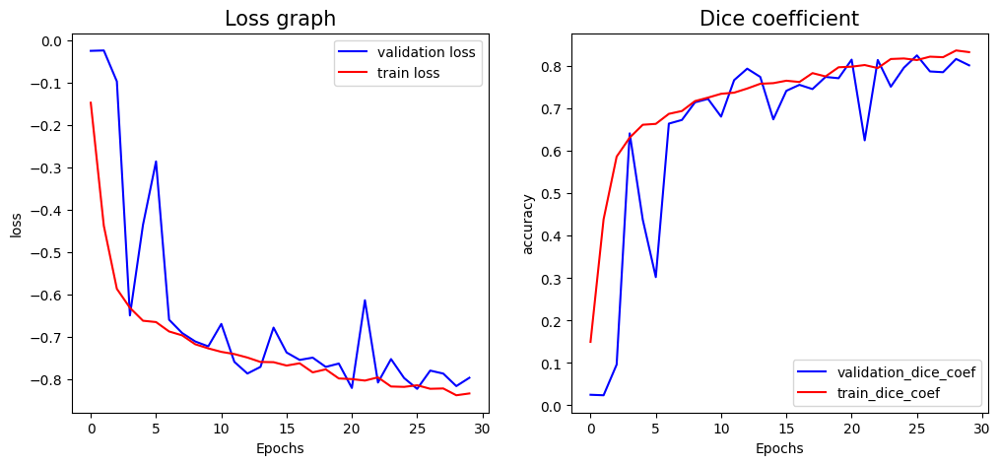

In [ ]:
import matplotlib.pyplot as plt

history = history.history

list_traindice = history['dice_coef']
list_valdice = history['val_dice_coef']

list_trainjaccard = history['iou']
list_valjaccard = history['val_iou']

list_trainloss = history['loss']
list_valloss = history['val_loss']

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(list_valloss, 'b-', label='validation loss')
plt.plot(list_trainloss,'r-', label='train loss')
plt.xlabel('Epochs')
plt.ylabel('loss')
plt.title('Loss graph', fontsize = 15)
plt.legend(['train', 'val'])
plt.legend(loc='best')

plt.subplot(1,2,2)
plt.plot(list_valdice, 'b-', label= 'validation_dice_coef')
plt.plot(list_traindice, 'r-', label= 'train_dice_coef')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.title('Dice coefficient', fontsize = 15)
plt.legend(['train', 'val'])
plt.legend(loc='best')
# plt.show()
plot_filename = os.path.join(save_dir, f'Dice coefficient Loss graph.png')
plt.savefig(plot_filename)
plt.show()



In [ ]:
np.save(f"{save_dir}/history_adam_Unet.npy", history)

In [ ]:
# from tensorflow.keras.models import Model, load_model, save_model
# model = unet(input=(im_height, im_width, 3),num_classes=1, deep_supervision=False)
# model.load_weights(f'{save_dir}/unet++_brain_mri_seg.hdf5')
# # , custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})
# model.compile(optimizer='adam', loss=combined_loss, metrics=[custom_binary_accuracy, iou, dice_coef])

In [ ]:
from tensorflow.keras.models import Model, load_model, save_model

model = load_model((f'{save_dir}/base_model_unet.hdf5'), custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})

In [ ]:
test_gen = train_generator(test,
                           BATCH_SIZE,
                           dict(),
                           target_size=(im_height, im_width))

results = model.evaluate(test_gen,
                         steps=len(test) / BATCH_SIZE)

print("Test lost: ",results[0])
print("Test IOU: ",results[1])
print("Test Dice Coefficent: ",results[2])

Found 393 validated image filenames.
Found 393 validated image filenames.
12/12 [==============================] - 6s 448ms/step - loss: -0.8138 - binary_accuracy: 0.9969 - iou: 0.6850 - dice_coef: 0.7910
Test lost:  -0.8138378858566284
Test IOU:  0.9969019889831543
Test Dice Coefficent:  0.6849711537361145


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 32ms/step


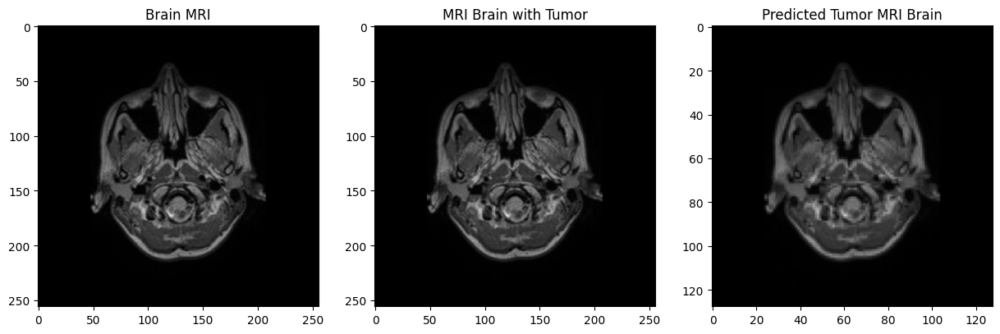

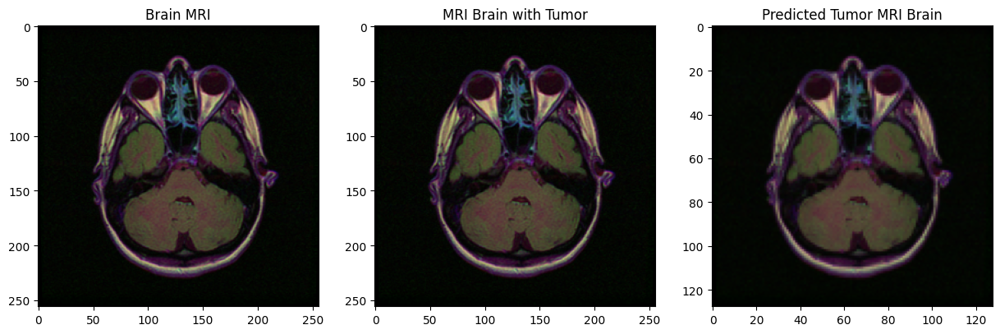

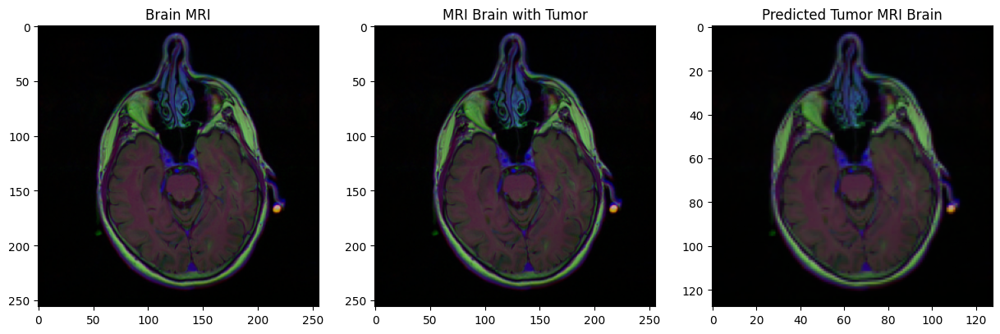

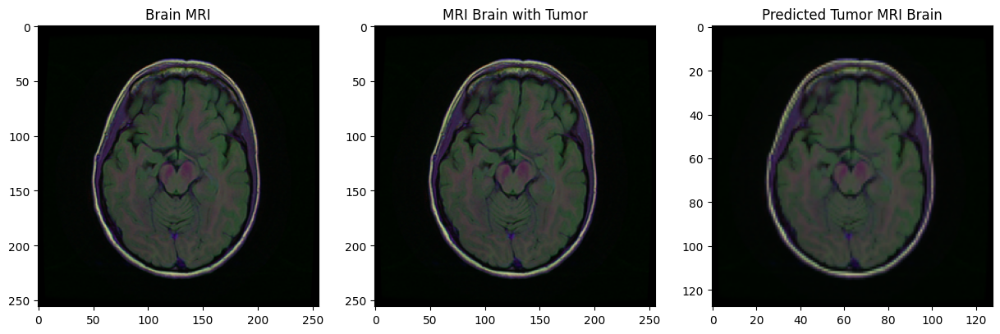

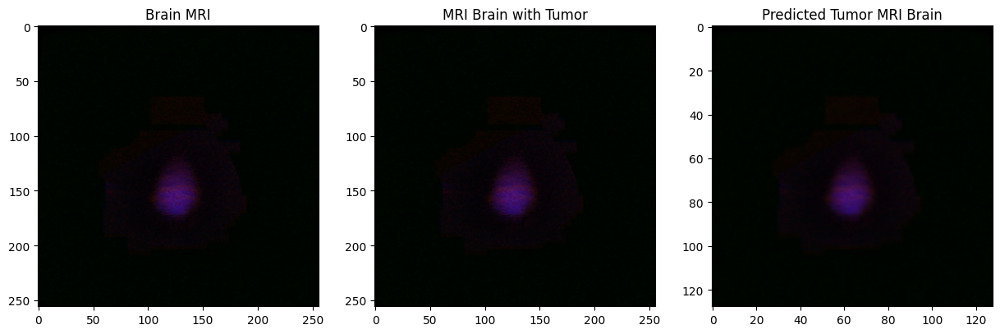

...

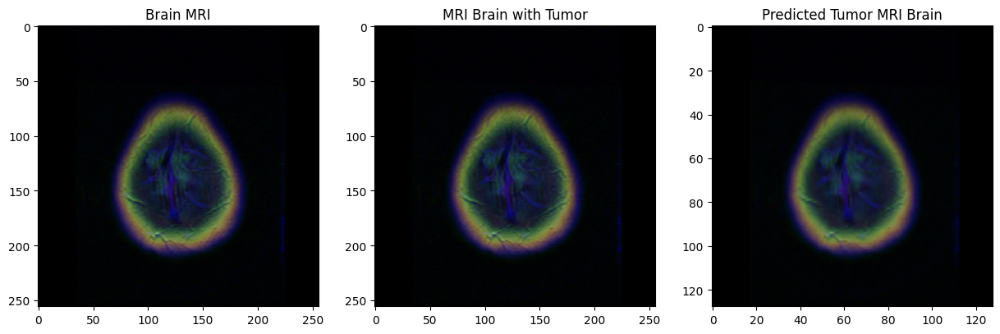

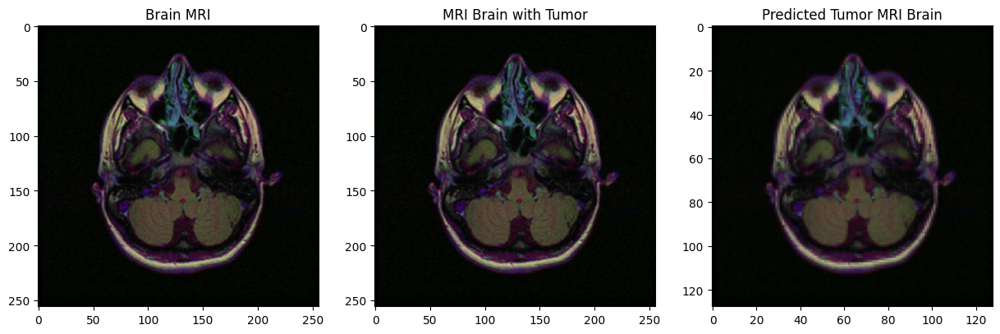

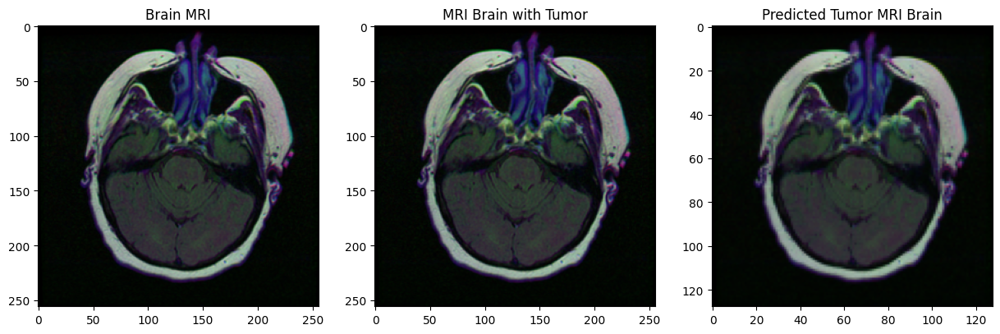

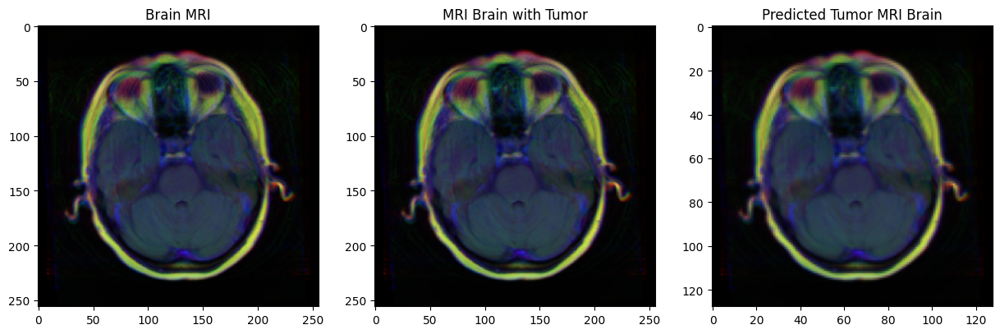

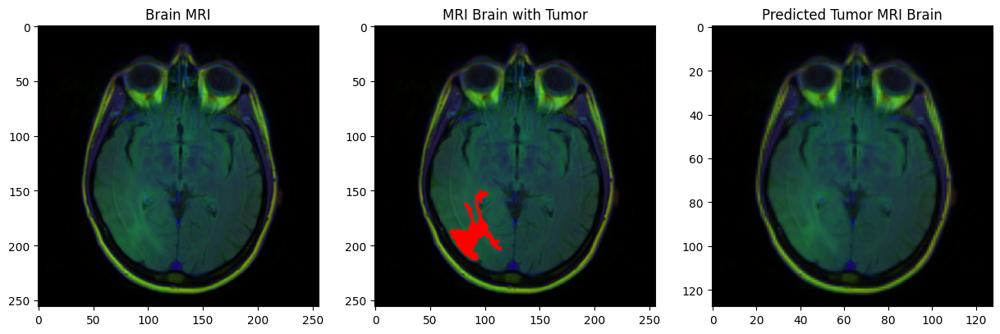

In [ ]:
for i in range(1,40,2):
    img_path_test = test.iloc[i, 0]
    msk_path_test = test.iloc[i, 1]
    img = cv2.imread(img_path_test)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    img1 = img.copy()
    img1 = cv2.resize(img1, (256, 256))
    img1 = img1 / 255.0
    img1_for_plotting = img1.copy()


    img = cv2.resize(img ,(im_height, im_width))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    msk= cv2.imread(msk_path_test)
    pred = model.predict(img) #predictions
    img = np.squeeze(img)

    #Plot the Brain MRI scans
    original = img1_for_plotting.copy()
    fig, ax = plt.subplots(1,3, figsize = (15,5))
    ax[0].imshow(original)
    ax[0].set_title("Brain MRI")

    # Plot the Brain MRI scan with their mask
    main = original.copy()
    label = cv2.imread(msk_path_test)
    sample = np.array(np.squeeze(label), dtype = np.uint8)
    contours, hier = cv2.findContours(sample[:,:,0],cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    sample_over_gt = cv2.drawContours(main, contours, -1,[255,0,0], thickness=-1)
    ax[1].imshow(np.squeeze(sample_over_gt))
    ax[1].set_title("MRI Brain with Tumor")

    #Plot the predicted mask on the Brain MRI Scan
    main = img.copy()
    sample = np.array(np.squeeze(pred) > 0.5, dtype = np.uint8)
    contours, hier = cv2.findContours(sample,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    sample_over_pr = cv2.drawContours(main, contours, -1, [255,0,0], thickness=-1)
    ax[2].imshow(np.squeeze(sample_over_pr))
    ax[2].set_title("Predicted Tumor MRI Brain")

1/1 [==============================] - 0s 19ms/step


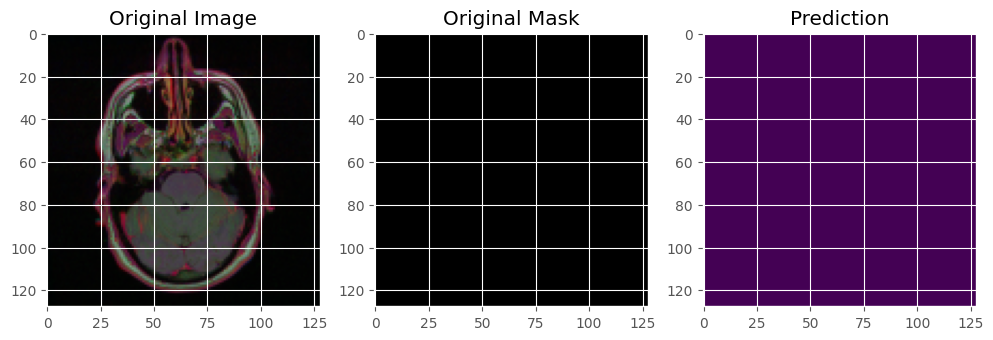

1/1 [==============================] - 0s 21ms/step


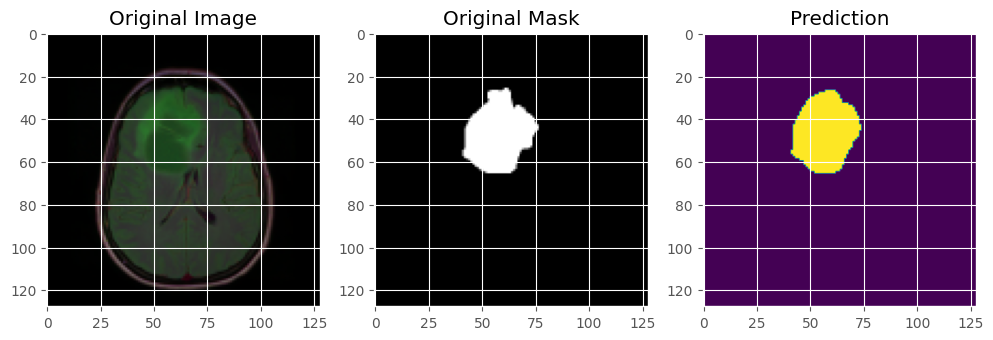

1/1 [==============================] - 0s 27ms/step


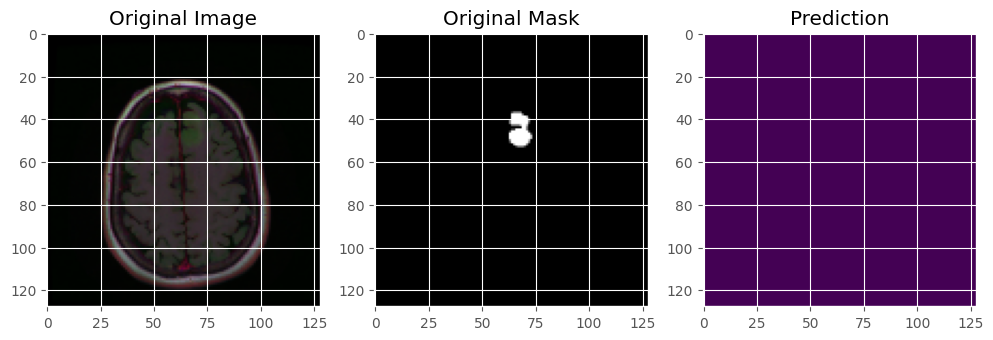

1/1 [==============================] - 0s 29ms/step


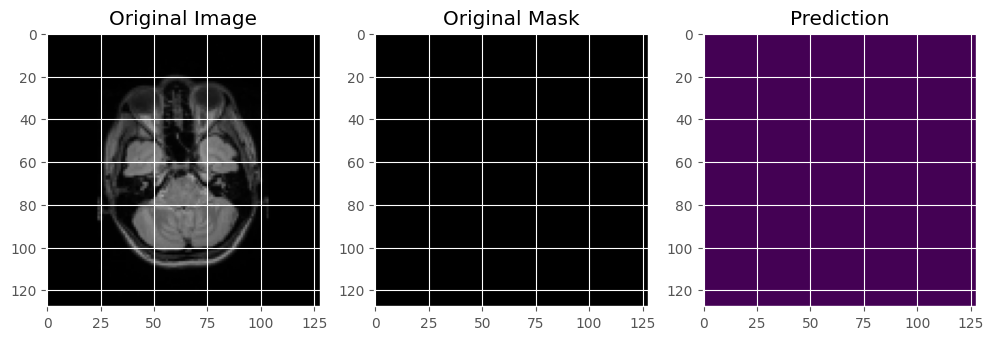

1/1 [==============================] - 0s 38ms/step


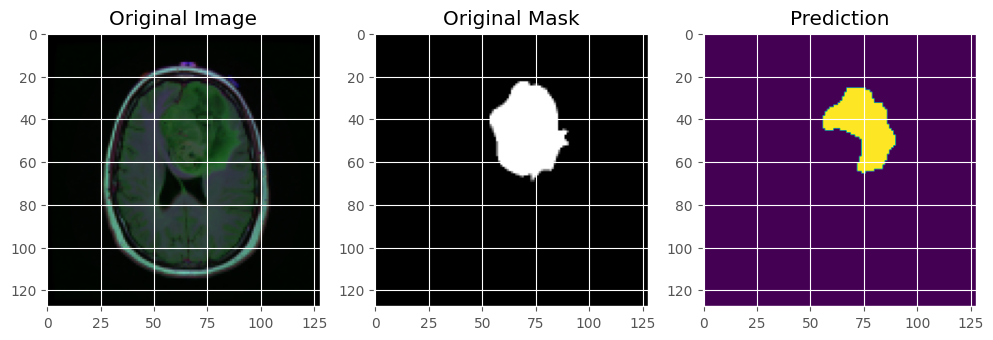

1/1 [==============================] - 0s 29ms/step


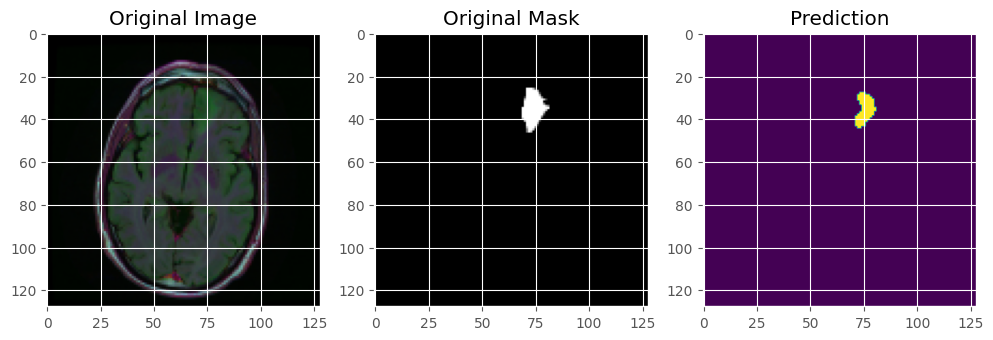

1/1 [==============================] - 0s 29ms/step


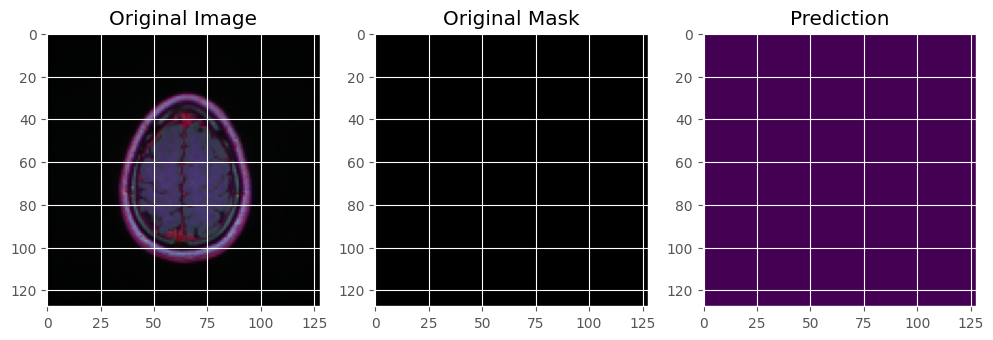

1/1 [==============================] - 0s 20ms/step


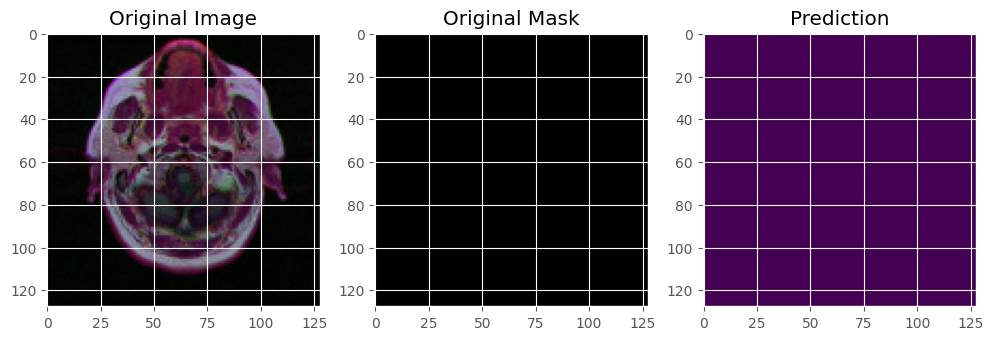

1/1 [==============================] - 0s 20ms/step


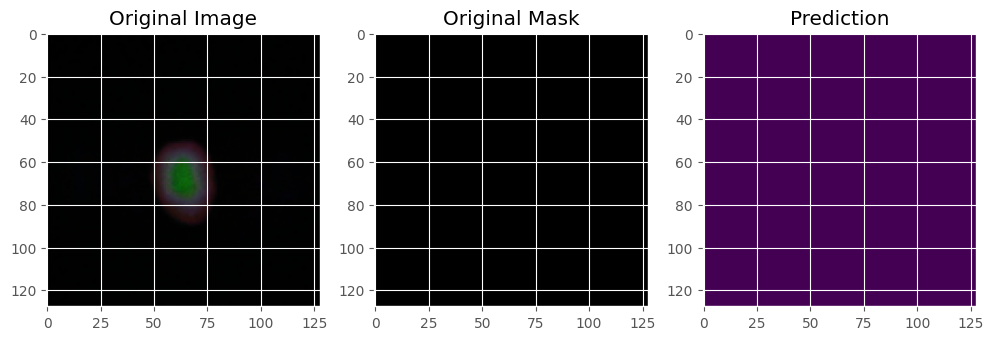

1/1 [==============================] - 0s 21ms/step


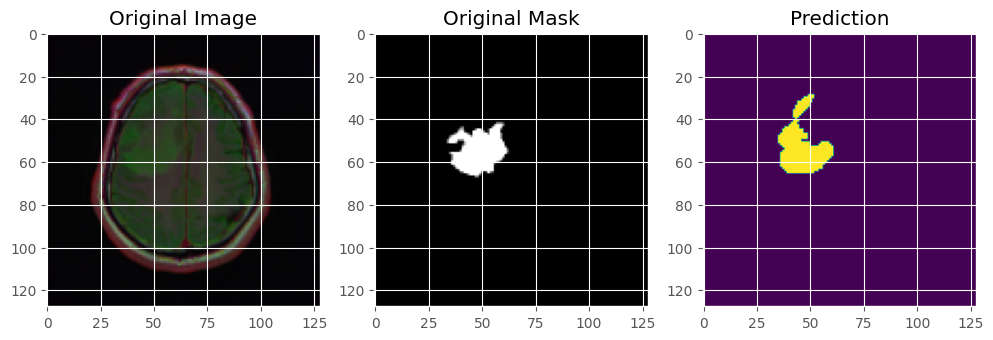

1/1 [==============================] - 0s 23ms/step


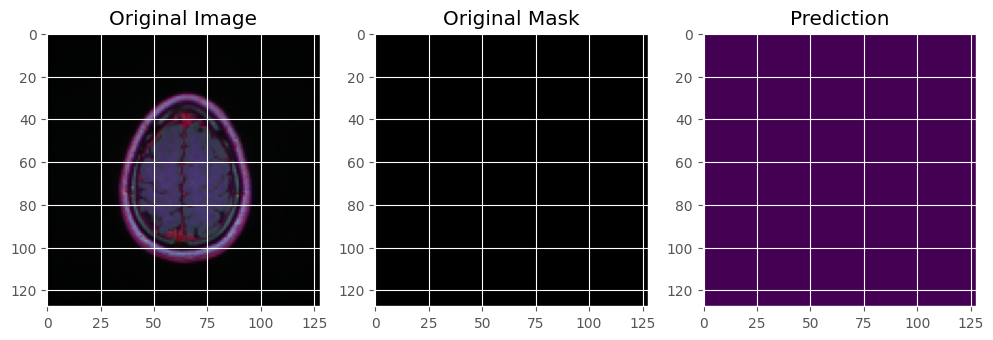

1/1 [==============================] - 0s 20ms/step


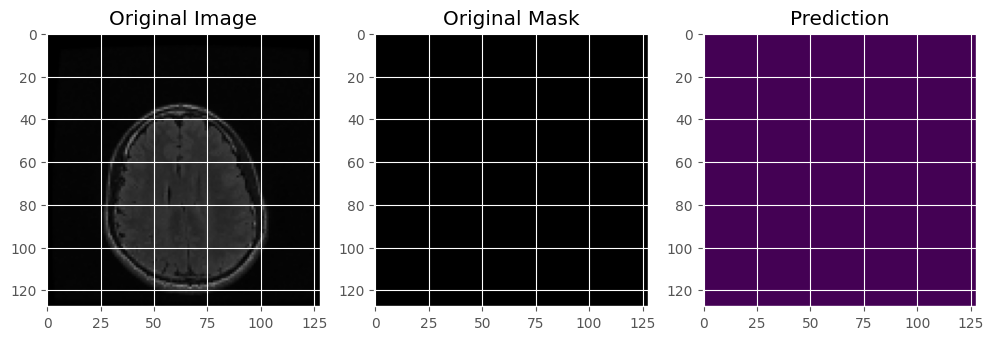

1/1 [==============================] - 0s 20ms/step


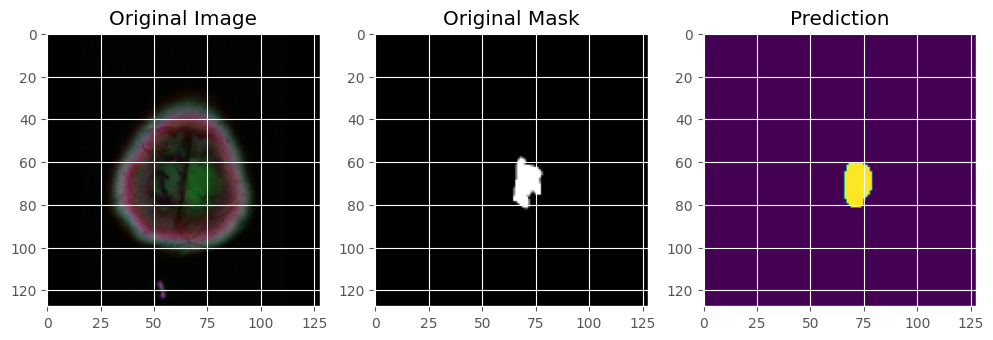

1/1 [==============================] - 0s 21ms/step


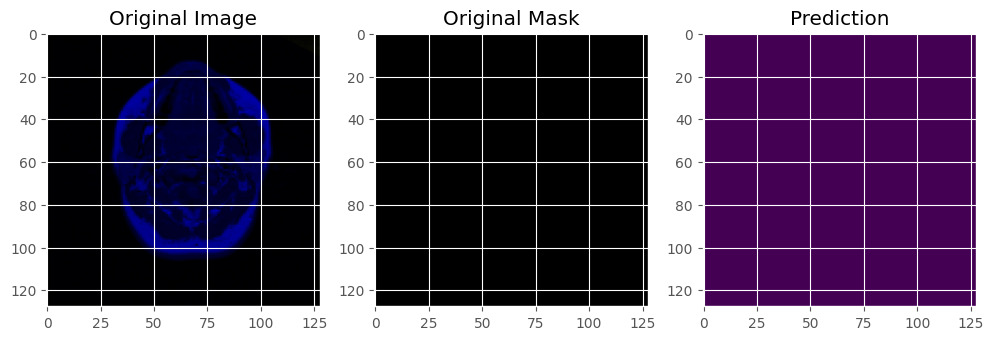

1/1 [==============================] - 0s 20ms/step


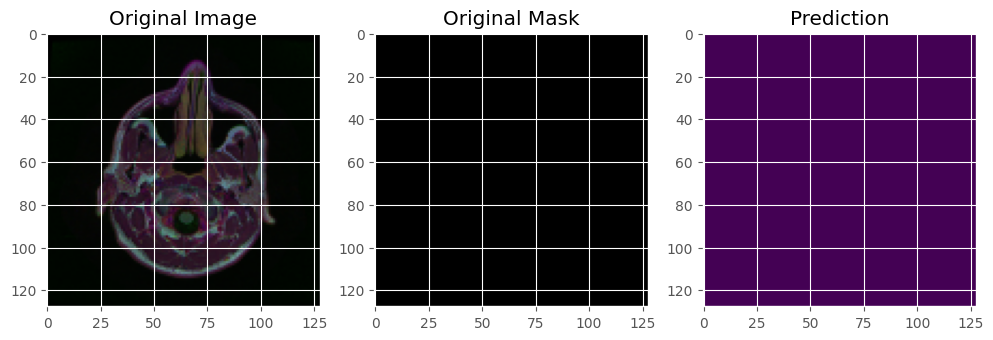

1/1 [==============================] - 0s 77ms/step


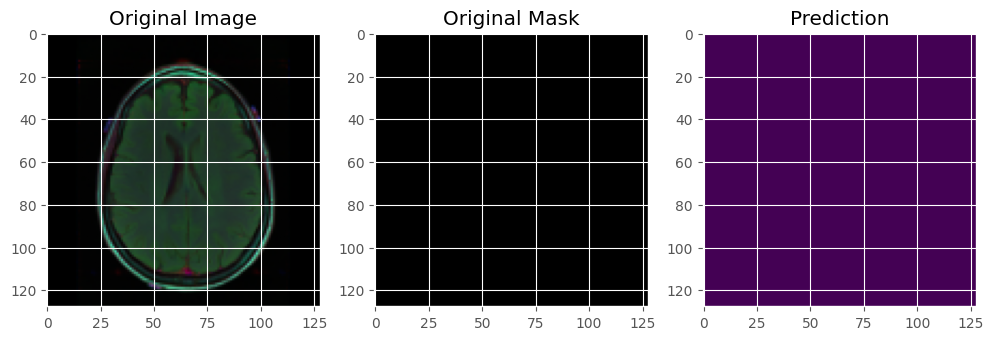

1/1 [==============================] - 0s 20ms/step


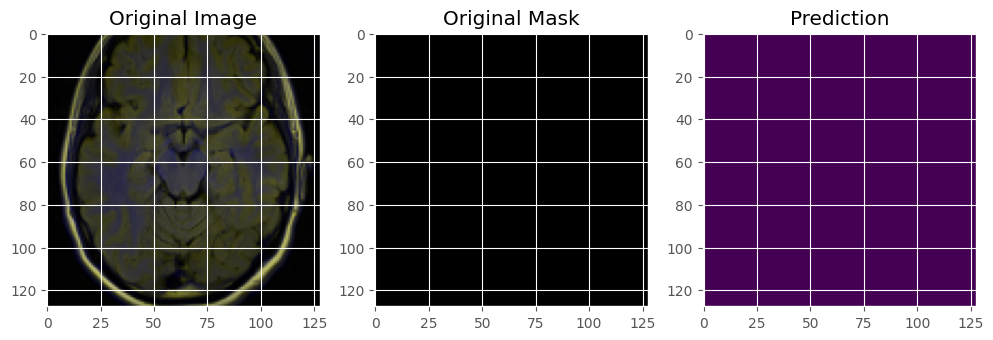

1/1 [==============================] - 0s 21ms/step


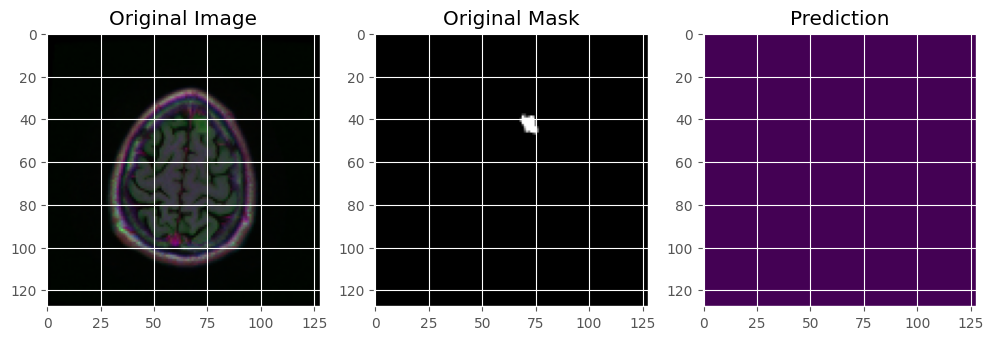

1/1 [==============================] - 0s 19ms/step


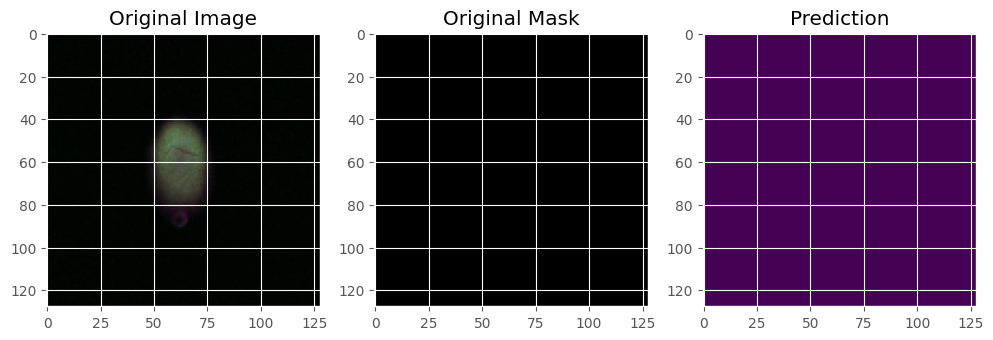

1/1 [==============================] - 0s 20ms/step


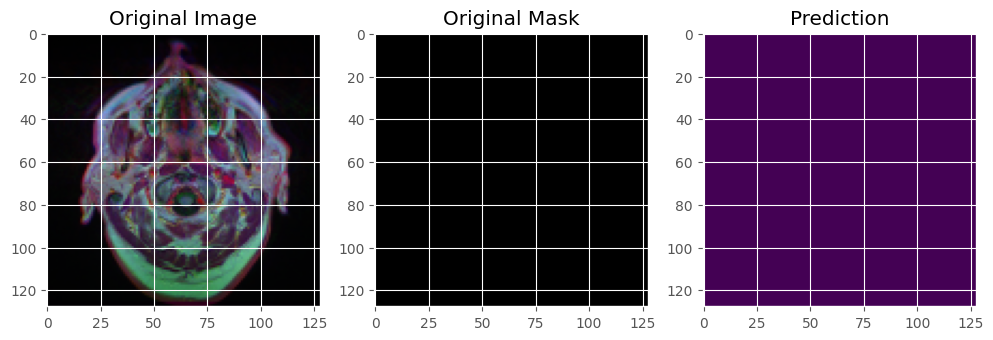

1/1 [==============================] - 0s 21ms/step


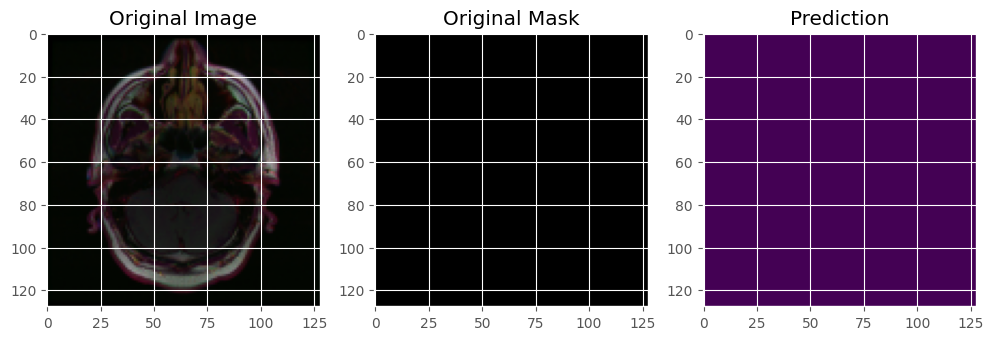

1/1 [==============================] - 0s 41ms/step


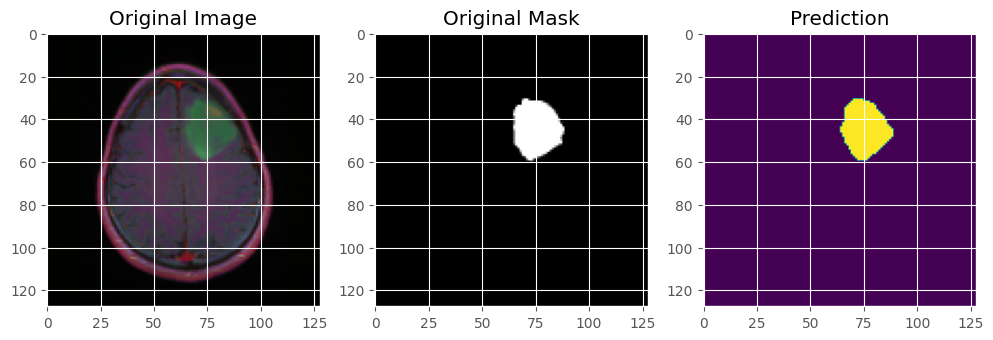

1/1 [==============================] - 0s 31ms/step


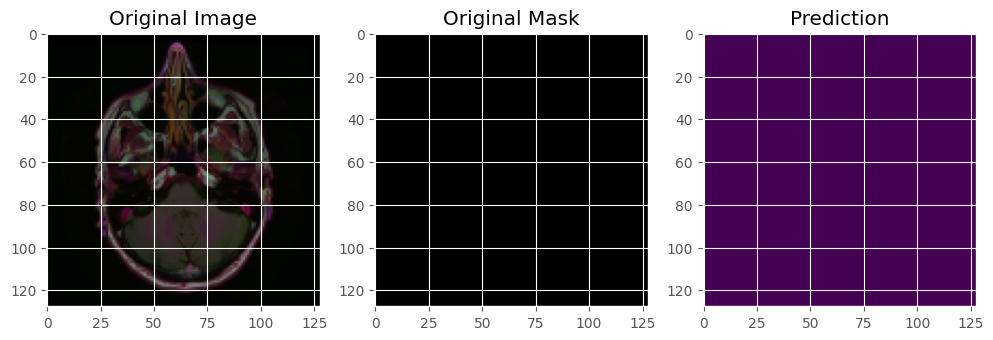

1/1 [==============================] - 0s 34ms/step


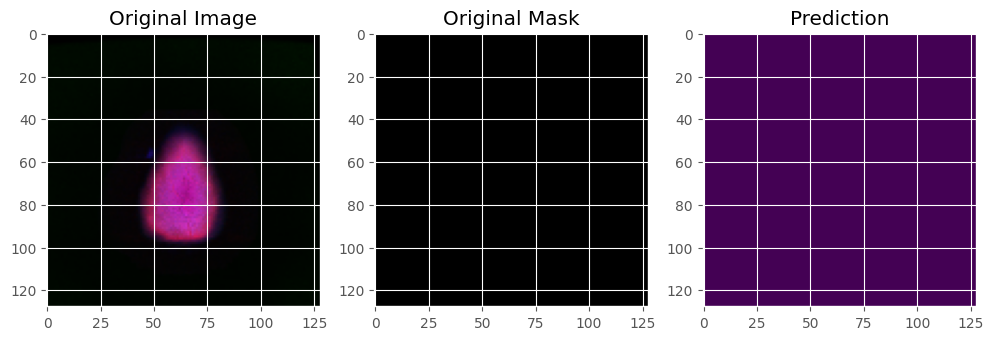

1/1 [==============================] - 0s 39ms/step


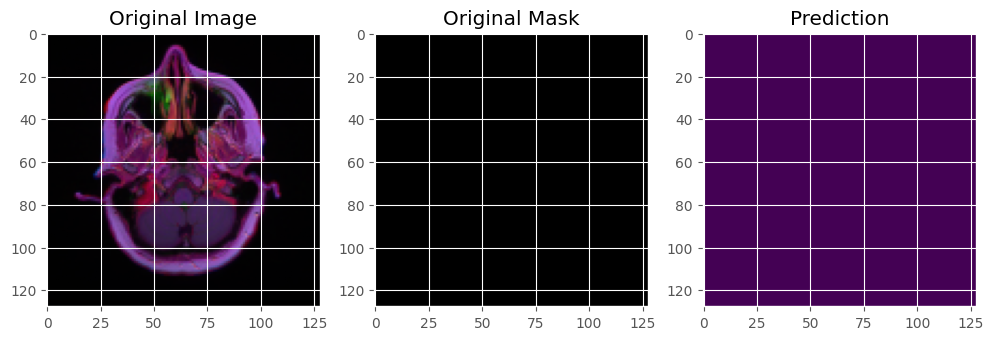

1/1 [==============================] - 0s 20ms/step


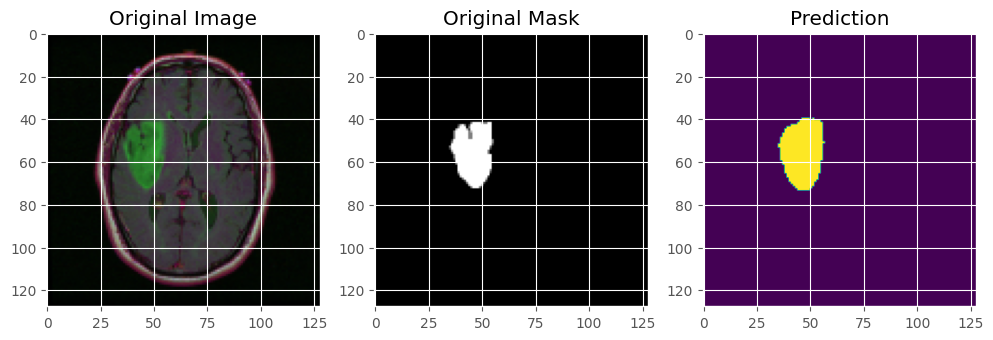

1/1 [==============================] - 0s 24ms/step


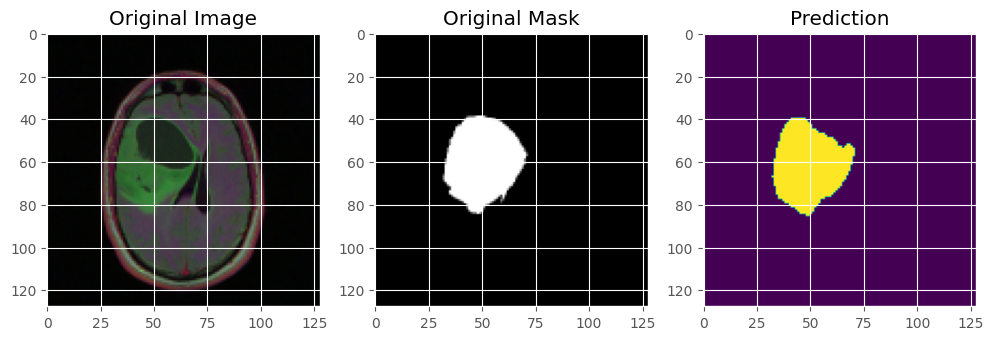

1/1 [==============================] - 0s 24ms/step


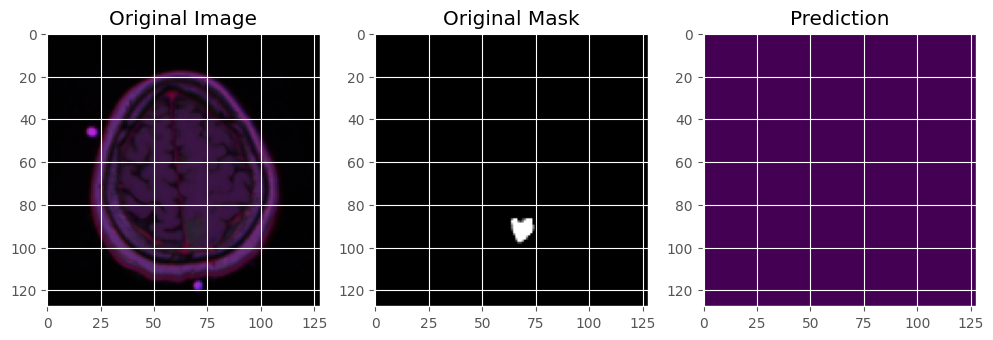

1/1 [==============================] - 0s 22ms/step


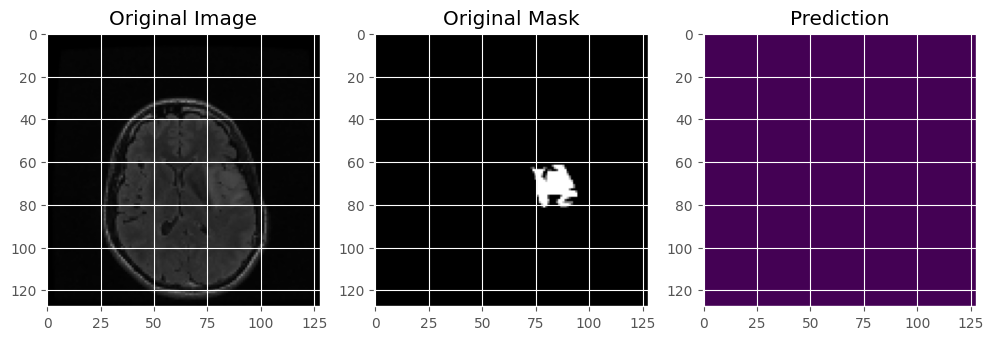

1/1 [==============================] - 0s 24ms/step


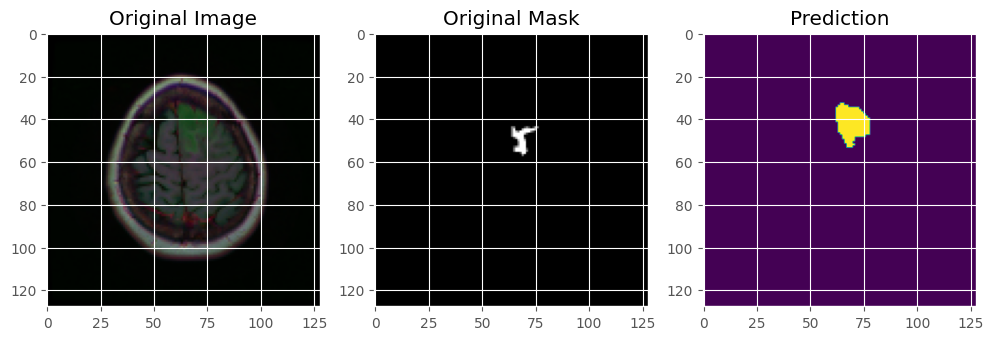

In [ ]:
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline
for i in range(30):
    index=np.random.randint(1,len(test.index))
    img = cv2.imread(test.iloc[index,0])
    img = cv2.resize(img ,(im_height, im_width))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)

    plt.figure(figsize=(12,12))
    plt.subplot(1,3,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')

    plt.subplot(1,3,2)
    msk = cv2.imread(test.iloc[index,1])
    msk = cv2.resize(msk ,(im_height, im_width))
    msk = msk / 255
    msk = msk[np.newaxis, :, :, :]
    plt.imshow(np.squeeze(msk))
    # plt.imshow(np.squeeze(cv2.imread(test.iloc[index,1])))
    plt.title('Original Mask')
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(pred) > .5)
    plt.title('Prediction')
    plt.show()

In [ ]:
# Lists to store Dice and IoU scores
dice_scores = []
iou_scores = []

# Assuming test is a pandas DataFrame with paths to test images and masks
for i in range(len(test)):
    image, mask = next(test_gen)


    # Predictions
    preds = model.predict(image)

    pred_binary = (preds > 0.5).astype(np.float32)  # Convert to binary mask

    # Calculate Dice and IoU scores
    dice_score = dice_coef_loss(mask,pred_binary).numpy()

    iou_score = iou(mask, pred_binary).numpy()

    # Append scores to lists
    dice_scores.append(dice_score)
    iou_scores.append(iou_score)

    # Optionally print the scores for each image
    print(f"Image {i}: Dice Coefficient = {dice_score}, IoU = {iou_score}")



1/1 [==============================] - 0s 27ms/step
Image 0: Dice Coefficient = -0.7957038879394531, IoU = 0.6639437675476074
1/1 [==============================] - 0s 22ms/step
Image 1: Dice Coefficient = -0.8230365514755249, IoU = 0.7007881999015808
1/1 [==============================] - 0s 21ms/step
Image 2: Dice Coefficient = -0.8127149939537048, IoU = 0.6861991882324219
1/1 [==============================] - 0s 22ms/step
Image 3: Dice Coefficient = -0.8394408226013184, IoU = 0.725265383720398
1/1 [==============================] - 0s 35ms/step
Image 4: Dice Coefficient = -0.8431034684181213, IoU = 0.7327459454536438
1/1 [==============================] - 0s 24ms/step
Image 5: Dice Coefficient = -0.8852274417877197, IoU = 0.7966566681861877
1/1 [==============================] - 0s 20ms/step
Image 6: Dice Coefficient = -0.31840795278549194, IoU = 0.29381442070007324
1/1 [==============================] - 0s 23ms/step
Image 7: Dice Coefficient = -0.8013874888420105, IoU = 0.67166113

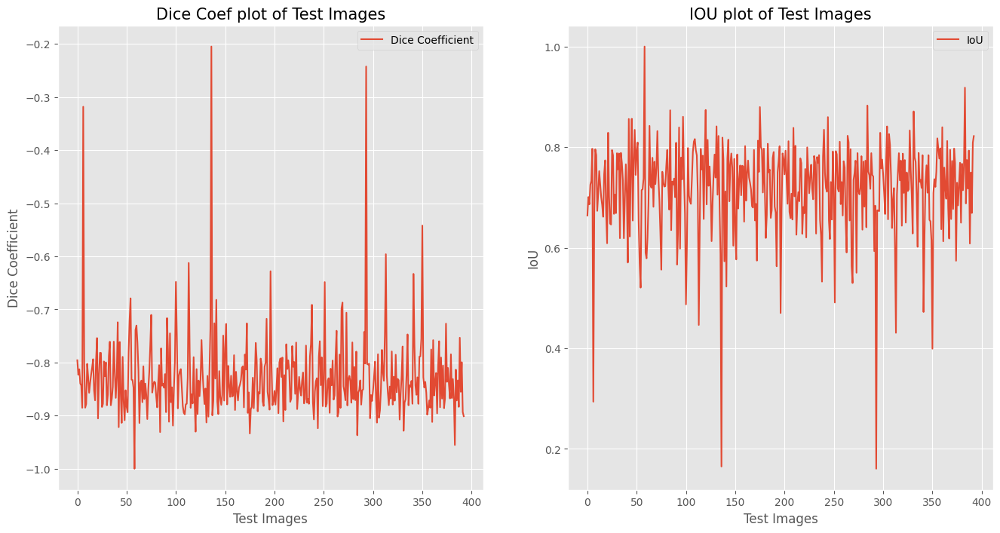

In [ ]:
# Convert lists to numpy arrays for easier analysis
dice_scores = np.array(dice_scores)
iou_scores = np.array(iou_scores)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(dice_scores, label='Dice Coefficient')
plt.xlabel('Test Images')
plt.ylabel('Dice Coefficient')
plt.title("Dice Coef plot of Test Images", fontsize=15)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(iou_scores, label='IoU')
plt.xlabel('Test Images')
plt.ylabel('IoU')
plt.title("IOU plot of Test Images", fontsize=15)
plt.legend()

plt.show()

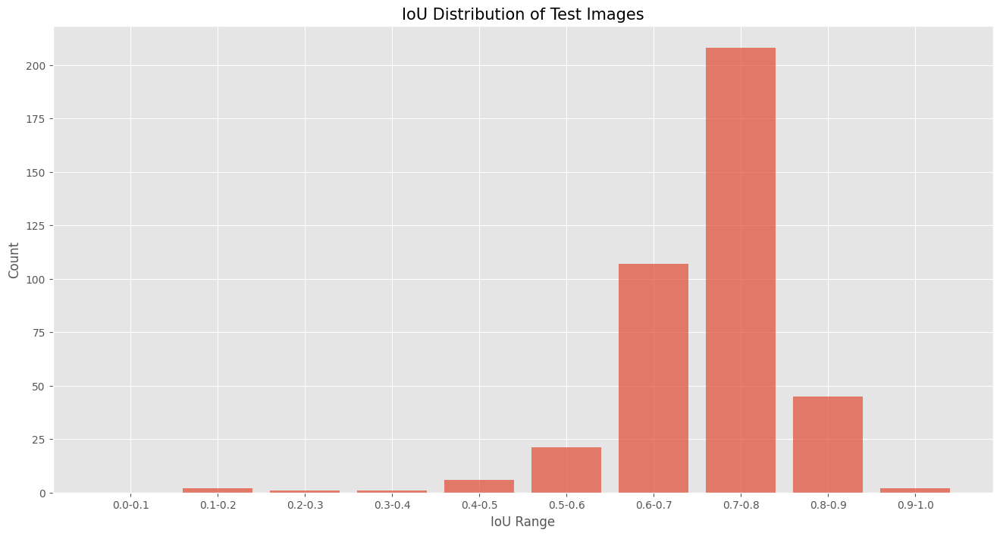

In [ ]:
bins = np.linspace(0,1,11)
iou_bins = np.digitize(iou_scores,bins,right=True)

iou_hist = np.histogram(iou_scores, bins = bins)
# Plotting the IoU distribution
# plt.subplot(1, 2, 2)
plt.figure(figsize=(16, 8))
plt.bar(range(len(bins)-1), iou_hist[0], align='center', alpha=0.7)
plt.xticks(range(len(bins)-1), [f"{bins[i]:.1f}-{bins[i+1]:.1f}" for i in range(len(bins)-1)])
plt.xlabel('IoU Range')
plt.ylabel('Count')
plt.title("IoU Distribution of Test Images", fontsize=15)

plt.show()

## Hypertune using different optimizers at LR =0.01

In [ ]:
learning_rate = 0.01

### SGD

In [ ]:
from tensorflow.keras.optimizers import SGD

# Using SGD optimizer
model_sgd = unet(input_size=(im_height, im_width, 3))

model_sgd.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

history_sgd = model_sgd.fit(train_gen,
                            steps_per_epoch=len(train) / BATCH_SIZE,
                            epochs=EPOCHS,
                            validation_data=test_gen,
                            validation_steps=len(val) / BATCH_SIZE,
                            callbacks=callbacks)


### Using RMSprop optimizer

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model_rmsprop = unet(input_size=(im_height, im_width, 3))

model_rmsprop.compile(optimizer=RMSprop(learning_rate=0.001), loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

history_rmsprop = model_rmsprop.fit(train_gen,
                                    steps_per_epoch=len(train) / BATCH_SIZE,
                                    epochs=EPOCHS,
                                    validation_data=test_gen,
                                    validation_steps=len(val) / BATCH_SIZE,
                                    callbacks=callbacks)

### Using Adam optimize

In [ ]:
from tensorflow.keras.optimizers import Adam

# Using Adam optimizer
model_adam = unet(input_size=(im_height, im_width, 3))

model_adam.compile(optimizer=Adam(learning_rate=0.001), loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

history_adam = model_adam.fit(train_gen,
                              steps_per_epoch=len(train) / BATCH_SIZE,
                              epochs=EPOCHS,
                              validation_data=test_gen,
                              validation_steps=len(val) / BATCH_SIZE,
                              callbacks=callbacks)

### Using Adagrad optimizer

In [ ]:
from tensorflow.keras.optimizers import Adagrad


model_adagrad = unet(input_size=(im_height, im_width, 3))

model_adagrad.compile(optimizer=Adagrad(learning_rate=0.01), loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

history_adagrad = model_adagrad.fit(train_gen,
                                    steps_per_epoch=len(train) / BATCH_SIZE,
                                    epochs=EPOCHS,
                                    validation_data=test_gen,
                                    validation_steps=len(val) / BATCH_SIZE,
                                    callbacks=callbacks)

### Using Adadelta optimizer

In [ ]:
from tensorflow.keras.optimizers import Adadelta


model_adadelta = unet(input_size=(im_height, im_width, 3))

model_adadelta.compile(optimizer=Adadelta(learning_rate=1.0), loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

history_adadelta = model_adadelta.fit(train_gen,
                                      steps_per_epoch=len(train) / BATCH_SIZE,
                                      epochs=EPOCHS,
                                      validation_data=test_gen,
                                      validation_steps=len(val) / BATCH_SIZE,
                                      callbacks=callbacks)

## Unet model with Dropout

In [ ]:
save_dir = '/content/drive/My Drive/tifr_notebook/unet/unet_dropout'
os.makedirs(save_dir, exist_ok=True)

In [ ]:
from tensorflow.keras.layers import Dropout

def unet_dropout(input_size=(128, 128, 3),dropout_rate=0.5):
    inputs = Input(input_size)

    # Stage 1
    conv1 = Conv2D(64, (3, 3), padding='same')(inputs)
    bn1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation('relu')(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)
    pool1 = Dropout(dropout_rate)(pool1)

    # Stage 2
    conv2 = Conv2D(128, (3, 3), padding='same')(pool1)
    bn2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation('relu')(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)
    pool2 = Dropout(dropout_rate)(pool2)

    # Stage 3
    conv3 = Conv2D(256, (3, 3), padding='same')(pool2)
    bn3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation('relu')(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)
    pool3 = Dropout(dropout_rate)(pool3)

    # Stage 4
    conv4 = Conv2D(512, (3, 3), padding='same')(pool3)
    bn4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation('relu')(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)
    pool4 = Dropout(dropout_rate)(pool4)

    # Stage 5
    conv5 = Conv2D(1024, (3, 3), padding='same')(pool4)
    bn5 = Activation('relu')(conv5)
    conv5 = Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation('relu')(bn5)

    # Upstage 1
    up6 = concatenate([Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = Activation('relu')(conv6)
    conv6 = Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation('relu')(bn6)

    # Upstage 2
    up7 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = Activation('relu')(conv7)
    conv7 = Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation('relu')(bn7)

    # Upstage 3
    up8 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = Activation('relu')(conv8)
    conv8 = Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation('relu')(bn8)

    # Upstage 4
    up9 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = Activation('relu')(conv9)
    conv9 = Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation('relu')(bn9)

    # Output
    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(bn9)

    return Model(inputs=[inputs], outputs=[conv10])


In [ ]:
# Define reducelr function to reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=15,
                              min_delta=0.0001,
                              factor=0.2
                             )

# Define the earltstop function
earlystopping = EarlyStopping(monitor='val_loss',
                              min_delta=0.001,
                              mode='min',
                              verbose=1,
                              patience=20,
                              restore_best_weights = True
                             )

# Defining the Callbacks Function
callbacks = [ earlystopping, reduce_lr]

In [ ]:
# List of dropout rates to test
dropout_rates = [0.3, 0.4, 0.5, 0.6, 0.7]

# Dictionary to store results
results = {}
print(BATCH_SIZE)
BATCH_SIZE=32
EPOCHS =20
# Loop over dropout rates
for dropout_rate in dropout_rates:
    print(f"Testing dropout rate: {dropout_rate}")
    model_dropout = unet_dropout(input_size=(im_height, im_width, 3), dropout_rate=dropout_rate)

    model_dropout.compile(optimizer='adam', loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])
    checkpointer = [ModelCheckpoint(f'{save_dir}/unet_model_dropout rate:{dropout_rate}.hdf5', verbose=1, save_best_only=True)]

    history_dropout = model_dropout.fit(train_gen,
                                        steps_per_epoch=len(train) / BATCH_SIZE,
                                        epochs=EPOCHS,
                                        validation_data=test_gen,
                                        validation_steps=len(val) / BATCH_SIZE,
                                        callbacks=callbacks+checkpointer)

    # Store the results
    results[dropout_rate] = history_dropout.history
    np.save(f"{save_dir}/history_unet_{dropout_rate}.npy", history_dropout.history)


np.save(f"{save_dir}/complete_history_unet_dropout.npy", results)



32
Testing dropout rate: 0.3
Found 2160 validated image filenames.
Found 2160 validated image filenames.
Epoch 1/20
68/67 [==============================] - ETA: 0s - loss: -0.1344 - binary_accuracy: 0.8935 - iou: 0.0762 - dice_coef: 0.1360Found 540 validated image filenames.
Found 540 validated image filenames.

Epoch 1: val_loss improved from inf to -0.02313, saving model to /content/drive/My Drive/tifr_notebook/unet/unet_dropout/unet_model_dropout rate:0.3.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


67/67 [==============================] - 95s 877ms/step - loss: -0.1344 - binary_accuracy: 0.8935 - iou: 0.0762 - dice_coef: 0.1360 - val_loss: -0.0231 - val_binary_accuracy: 0.1323 - val_iou: 0.0118 - val_dice_coef: 0.0232 - lr: 0.0010
Epoch 2/20
68/67 [==============================] - ETA: 0s - loss: -0.4031 - binary_accuracy: 0.9872 - iou: 0.2651 - dice_coef: 0.4049
Epoch 2: val_loss improved from -0.02313 to -0.16578, saving model to /content/drive/My Drive/tifr_notebook/unet/unet_dropout/unet_model_dropout rate:0.3.hdf5
67/67 [==============================] - 43s 640ms/step - loss: -0.4031 - binary_accuracy: 0.9872 - iou: 0.2651 - dice_coef: 0.4049 - val_loss: -0.1658 - val_binary_accuracy: 0.9903 - val_iou: 0.0959 - val_dice_coef: 0.1659 - lr: 0.0010
Epoch 3/20
68/67 [==============================] - ETA: 0s - loss: -0.5087 - binary_accuracy: 0.9896 - iou: 0.3548 - dice_coef: 0.5094
Epoch 3: val_loss did not improve from -0.16578
67/67 [==============================] - 34s 50

In [ ]:
results = np.load('/content/drive/My Drive/tifr_notebook/unet/unet_dropout/complete_history_unet_dropout.npy', allow_pickle=True).item()

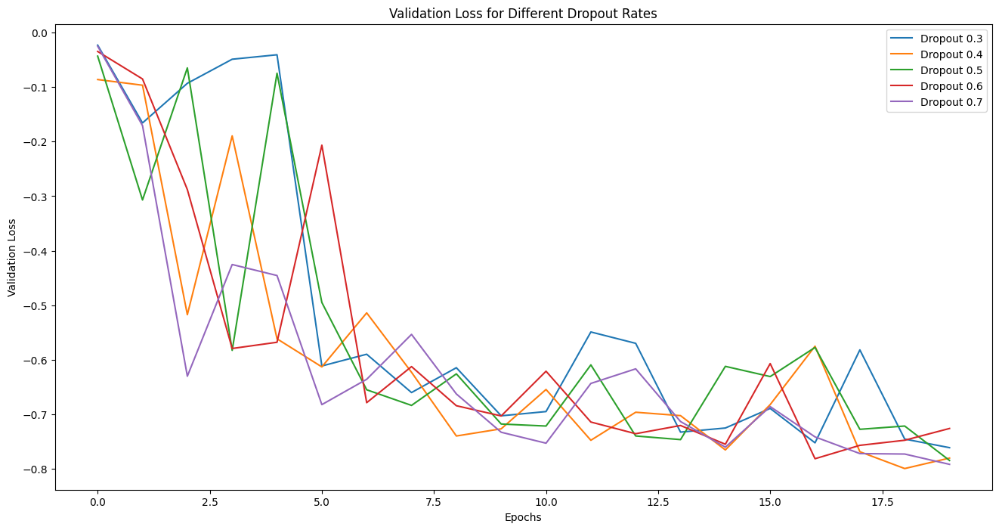

In [ ]:
# Plot the results
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 8))
for dropout_rate, history in results.items():
    plt.plot(history['val_loss'], label=f'Dropout {dropout_rate}')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.title('Validation Loss for Different Dropout Rates')
plt.show()


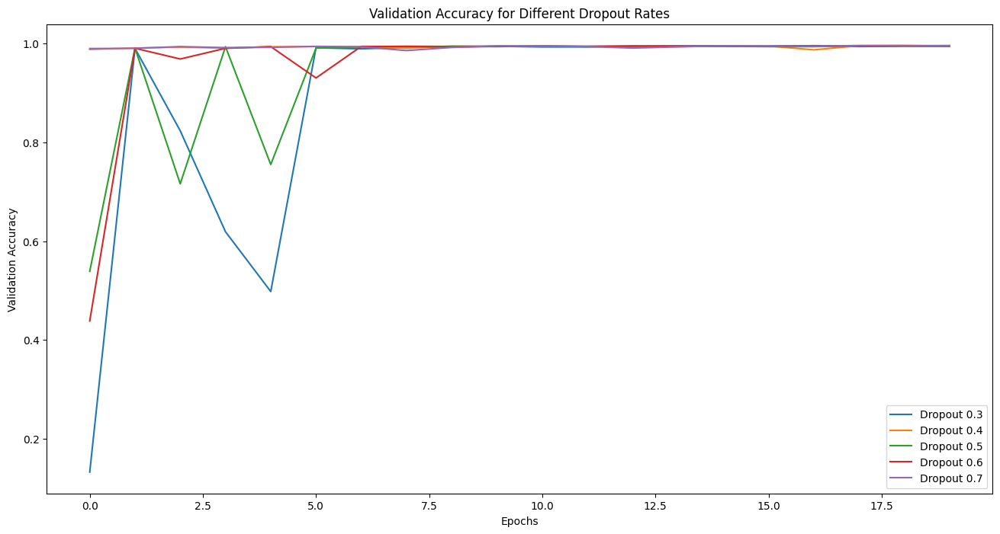

In [ ]:

plt.figure(figsize=(16, 8))
for dropout_rate, history in results.items():
    plt.plot(history['val_binary_accuracy'], label=f'Dropout {dropout_rate}')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.legend()
plt.title('Validation Accuracy for Different Dropout Rates')
plt.show()

In [ ]:
dropout_rates = results.keys()
train_accuracy = {}
train_dice_coef ={}
train_iou ={}
val_accuracy = {}
val_dice_coef ={}
val_iou = {}

for dropout_rate, history in results.items():
  train_accuracy[dropout_rate] = history['binary_accuracy']
  train_dice_coef[dropout_rate] = history['dice_coef']
  train_iou[dropout_rate] = history['iou']

  val_accuracy[dropout_rate] = history['val_binary_accuracy']
  val_dice_coef[dropout_rate] = history['val_dice_coef']
  val_iou[dropout_rate] = history['val_iou']

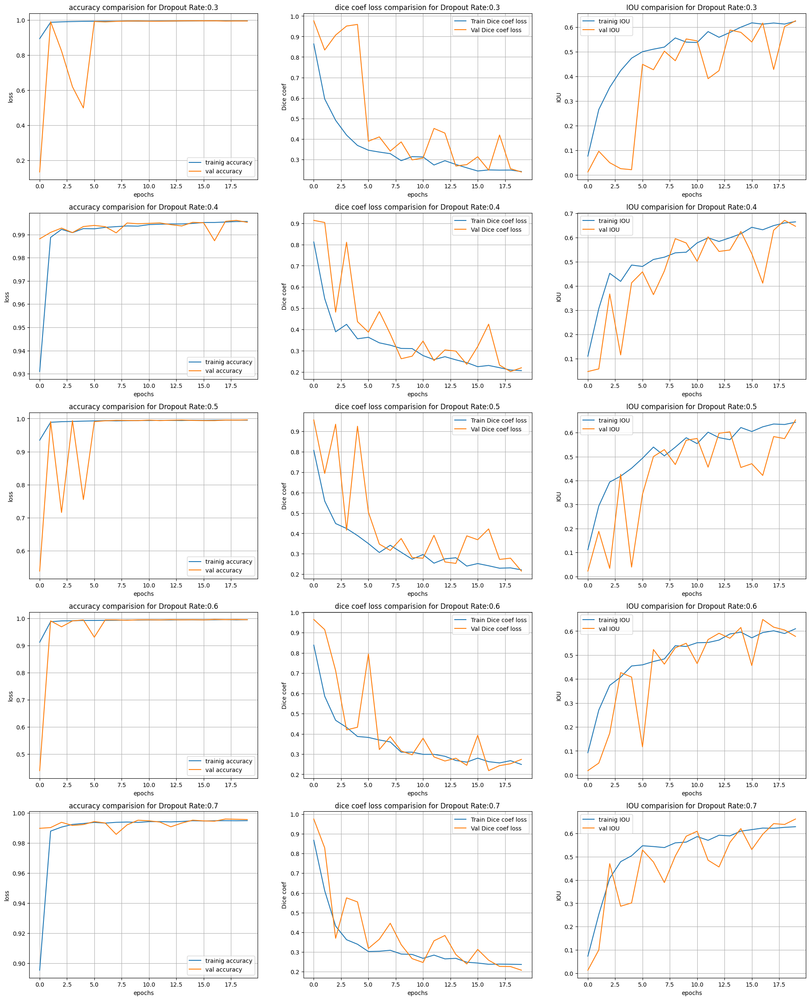

In [ ]:
fig, axes = plt.subplots(len(dropout_rates), 3, figsize =(24, 6 * len(dropout_rates)) )

for i,d_r in enumerate(dropout_rates):

  ax = axes[i,0]
  ax.plot(train_accuracy[d_r], label='trainig accuracy')
  ax.plot(val_accuracy[d_r], label = 'val accuracy')
  ax.set_title(f"accuracy comparision for Dropout Rate:{d_r}")
  ax.set_xlabel('epochs')
  ax.set_ylabel('loss')
  ax.legend()
  ax.grid()

  ax = axes[i,1]
  ax.plot(list(1-i for i in train_dice_coef[d_r]), label='Train Dice coef loss')
  ax.plot(list(1-i for i in val_dice_coef[d_r]), label = 'Val Dice coef loss')
  ax.set_title(f"dice coef loss comparision for Dropout Rate:{d_r}")
  ax.set_xlabel('epochs')
  ax.set_ylabel('Dice coef')
  ax.legend()
  ax.grid()

  ax = axes[i,2]
  ax.plot(train_iou[d_r], label='trainig IOU')
  ax.plot(val_iou[d_r], label = 'val IOU')
  ax.set_title(f"IOU comparision for Dropout Rate:{d_r}")
  ax.set_xlabel('epochs')
  ax.set_ylabel('IOU')
  ax.legend()
  ax.grid()


## OPTUNA OPTIMISER

In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 10.7 MB/s eta 0:00:00


In [ ]:
import optuna
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adagrad, Adadelta

In [ ]:
save_dir = '/content/drive/My Drive/tifr_notebook/unet/unet_optuna'
os.makedirs(save_dir, exist_ok=True)

In [ ]:
from tensorflow.keras.layers import Dropout

def unet_optuna(input_size=(128, 128, 3),dropout_rate=0.5):
    inputs = Input(input_size)

    # Stage 1
    conv1 = Conv2D(64, (3, 3), padding='same')(inputs)
    bn1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation('relu')(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)
    pool1 = Dropout(dropout_rate)(pool1)

    # Stage 2
    conv2 = Conv2D(128, (3, 3), padding='same')(pool1)
    bn2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation('relu')(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)
    pool2 = Dropout(dropout_rate)(pool2)

    # Stage 3
    conv3 = Conv2D(256, (3, 3), padding='same')(pool2)
    bn3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation('relu')(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)
    pool3 = Dropout(dropout_rate)(pool3)

    # Stage 4
    conv4 = Conv2D(512, (3, 3), padding='same')(pool3)
    bn4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation('relu')(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)
    pool4 = Dropout(dropout_rate)(pool4)

    # Stage 5
    conv5 = Conv2D(1024, (3, 3), padding='same')(pool4)
    bn5 = Activation('relu')(conv5)
    conv5 = Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation('relu')(bn5)

    # Upstage 1
    up6 = concatenate([Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = Activation('relu')(conv6)
    conv6 = Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation('relu')(bn6)

    # Upstage 2
    up7 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = Activation('relu')(conv7)
    conv7 = Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation('relu')(bn7)

    # Upstage 3
    up8 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = Activation('relu')(conv8)
    conv8 = Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation('relu')(bn8)

    # Upstage 4
    up9 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = Activation('relu')(conv9)
    conv9 = Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation('relu')(bn9)

    # Output
    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

In [ ]:
# Define reducelr function to reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=15,
                              min_delta=0.0001,
                              factor=0.2
                             )

# Define the earltstop function
earlystopping = EarlyStopping(monitor='val_loss',
                              min_delta=0.001,
                              mode='min',
                              verbose=1,
                              patience=20,
                              restore_best_weights = True
                             )

# Defining the Callbacks Function

checkpointer2 = [ModelCheckpoint(f'{save_dir}/unet_model_optuna.hdf5', verbose=1, save_best_only=True)]
callbacks = [checkpointer2, earlystopping, reduce_lr]

In [ ]:
def objective(trail):
  learning_rate= trail.suggest_loguniform('learning_rate',1e-5,1e-1)
  optimizer = trail.suggest_categorical('optimizer',['Adam','SGD','RMSprop','Adadelta','Adagrad'])
  epoch = trail.suggest_categorical('epoch', [20,30,40])
  batch_size = trail.suggest_categorical('batch_size', [8,16,32,64])
  dopout_rate = trail.suggest_uniform('dopout_rate', 0.0,0.8)

  model_optuna = unet_optuna(input_size = (im_height,im_width,3), dropout_rate = dopout_rate)

  if optimizer =='Adam':
    optimizer = Adam(learning_rate = learning_rate)
  elif optimizer == 'SGD':
    optimizer = SGD(learning_rate = learning_rate)
  elif optimizer == 'RMSprop':
    optimizer = RMSprop(learning_rate = learning_rate)
  elif optimizer == 'Adadelta':
    optimizer = Adadelta(learning_rate = learning_rate)
  else:
    optimizer = Adagrad(learning_rate = learning_rate)

  model_optuna.compile(optimizer = optimizer, loss = dice_coef_loss, metrics = ["binary_accuracy", iou, dice_coef])

  history_dropout = model_optuna.fit(train_gen,
                                    steps_per_epoch=len(train) / batch_size,
                                    epochs=epoch,
                                    validation_data=test_gen,
                                    validation_steps=len(val) / batch_size,
                                    callbacks=callbacks)

  max_dice_coef = max(history_dropout.history['val_dice_coef'])
  return -max_dice_coef



In [ ]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print('Best hyperparameters: ', study.best_params)

[I 2024-05-29 11:40:52,756] A new study created in memory with name: no-name-63e43940-5cca-4d1b-a0d6-8cdc882c8d0b
<ipython-input-29-fdbdac45fdb9>:2: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate= trail.suggest_loguniform('learning_rate',1e-5,1e-1)
<ipython-input-29-fdbdac45fdb9>:6: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dopout_rate = trail.suggest_uniform('dopout_rate', 0.0,0.8)


Found 2160 validated image filenames.
Found 2160 validated image filenames.
Epoch 1/30
34/33 [==============================] - ETA: 0s - loss: -0.0239 - binary_accuracy: 0.4507 - iou: 0.0123 - dice_coef: 0.0239Found 540 validated image filenames.
Found 540 validated image filenames.

Epoch 1: val_loss improved from inf to -0.01738, saving model to /content/drive/My Drive/tifr_notebook/unet/unet_optuna/unet_model_optuna.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


33/33 [==============================] - 57s 569ms/step - loss: -0.0239 - binary_accuracy: 0.4507 - iou: 0.0123 - dice_coef: 0.0239 - val_loss: -0.0174 - val_binary_accuracy: 0.6807 - val_iou: 0.0090 - val_dice_coef: 0.0174 - lr: 0.0133
Epoch 2/30
34/33 [==============================] - ETA: 0s - loss: -0.0318 - binary_accuracy: 0.5367 - iou: 0.0166 - dice_coef: 0.0322
Epoch 2: val_loss improved from -0.01738 to -0.01925, saving model to /content/drive/My Drive/tifr_notebook/unet/unet_optuna/unet_model_optuna.hdf5
33/33 [==============================] - 41s 1s/step - loss: -0.0318 - binary_accuracy: 0.5367 - iou: 0.0166 - dice_coef: 0.0322 - val_loss: -0.0192 - val_binary_accuracy: 0.7752 - val_iou: 0.0099 - val_dice_coef: 0.0192 - lr: 0.0133
Epoch 3/30
34/33 [==============================] - ETA: 0s - loss: -0.0354 - binary_accuracy: 0.6072 - iou: 0.0182 - dice_coef: 0.0354
Epoch 3: val_loss improved from -0.01925 to -0.02072, saving model to /content/drive/My Drive/tifr_notebook/u

[I 2024-05-29 11:52:24,902] Trial 0 finished with value: -0.48736223578453064 and parameters: {'learning_rate': 0.013254376937024191, 'optimizer': 'SGD', 'epoch': 30, 'batch_size': 64, 'dopout_rate': 0.11520176621352657}. Best is trial 0 with value: -0.48736223578453064.
<ipython-input-29-fdbdac45fdb9>:2: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate= trail.suggest_loguniform('learning_rate',1e-5,1e-1)
<ipython-input-29-fdbdac45fdb9>:6: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dopout_rate = trail.suggest_uniform('dopout_rate', 0.0,0.8)


Epoch 1/20
68/67 [==============================] - ETA: 0s - loss: -0.1638 - binary_accuracy: 0.9162 - iou: 0.0980 - dice_coef: 0.1634
Epoch 1: val_loss did not improve from -0.48776
67/67 [==============================] - 44s 542ms/step - loss: -0.1638 - binary_accuracy: 0.9162 - iou: 0.0980 - dice_coef: 0.1634 - val_loss: -0.2598 - val_binary_accuracy: 0.9775 - val_iou: 0.1565 - val_dice_coef: 0.2588 - lr: 0.0065
Epoch 2/20
68/67 [==============================] - ETA: 0s - loss: -0.4064 - binary_accuracy: 0.9867 - iou: 0.2733 - dice_coef: 0.4069
Epoch 2: val_loss did not improve from -0.48776
67/67 [==============================] - 35s 523ms/step - loss: -0.4064 - binary_accuracy: 0.9867 - iou: 0.2733 - dice_coef: 0.4069 - val_loss: -0.1119 - val_binary_accuracy: 0.9904 - val_iou: 0.0744 - val_dice_coef: 0.1113 - lr: 0.0065
Epoch 3/20
68/67 [==============================] - ETA: 0s - loss: -0.4202 - binary_accuracy: 0.9878 - iou: 0.2827 - dice_coef: 0.4202
Epoch 3: val_loss did 

[I 2024-05-29 12:05:51,439] Trial 1 finished with value: -0.6965962648391724 and parameters: {'learning_rate': 0.0064598544425110175, 'optimizer': 'RMSprop', 'epoch': 20, 'batch_size': 32, 'dopout_rate': 0.567490693996701}. Best is trial 1 with value: -0.6965962648391724.


Epoch 1/40
135/135 [==============================] - ETA: 0s - loss: -0.0420 - binary_accuracy: 0.7588 - iou: 0.0218 - dice_coef: 0.0421
Epoch 1: val_loss did not improve from -0.69598
135/135 [==============================] - 85s 563ms/step - loss: -0.0420 - binary_accuracy: 0.7588 - iou: 0.0218 - dice_coef: 0.0421 - val_loss: -0.0221 - val_binary_accuracy: 0.9833 - val_iou: 0.0114 - val_dice_coef: 0.0221 - lr: 0.0141
Epoch 2/40
135/135 [==============================] - ETA: 0s - loss: -0.0598 - binary_accuracy: 0.7751 - iou: 0.0312 - dice_coef: 0.0597
Epoch 2: val_loss did not improve from -0.69598
135/135 [==============================] - 74s 549ms/step - loss: -0.0598 - binary_accuracy: 0.7751 - iou: 0.0312 - dice_coef: 0.0597 - val_loss: -0.0339 - val_binary_accuracy: 0.9842 - val_iou: 0.0176 - val_dice_coef: 0.0339 - lr: 0.0141
Epoch 3/40
135/135 [==============================] - ETA: 0s - loss: -0.0748 - binary_accuracy: 0.8590 - iou: 0.0393 - dice_coef: 0.0746
Epoch 3: val

[I 2024-05-29 12:55:31,084] Trial 2 finished with value: -0.7417616248130798 and parameters: {'learning_rate': 0.014098720620231146, 'optimizer': 'Adadelta', 'epoch': 40, 'batch_size': 16, 'dopout_rate': 0.2232102121343842}. Best is trial 2 with value: -0.7417616248130798.


Epoch 1/20
270/270 [==============================] - ETA: 0s - loss: -0.0228 - binary_accuracy: 0.0971 - iou: 0.0117 - dice_coef: 0.0228
Epoch 1: val_loss did not improve from -0.74192
270/270 [==============================] - 159s 569ms/step - loss: -0.0228 - binary_accuracy: 0.0971 - iou: 0.0117 - dice_coef: 0.0228 - val_loss: -0.0195 - val_binary_accuracy: 0.2504 - val_iou: 0.0100 - val_dice_coef: 0.0195 - lr: 1.0465e-04
Epoch 2/20
270/270 [==============================] - ETA: 0s - loss: -0.0226 - binary_accuracy: 0.1005 - iou: 0.0116 - dice_coef: 0.0226
Epoch 2: val_loss did not improve from -0.74192
270/270 [==============================] - 147s 544ms/step - loss: -0.0226 - binary_accuracy: 0.1005 - iou: 0.0116 - dice_coef: 0.0226 - val_loss: -0.0197 - val_binary_accuracy: 0.1711 - val_iou: 0.0101 - val_dice_coef: 0.0196 - lr: 1.0465e-04
Epoch 3/20
270/270 [==============================] - ETA: 0s - loss: -0.0235 - binary_accuracy: 0.1045 - iou: 0.0120 - dice_coef: 0.0234
Ep

In [ ]:
print('Best hyperparameters: ', study.best_params)

In [ ]:
[I 2024-05-29 12:55:31,084] Trial 2 finished with value: -0.7417616248130798 and parameters: {'learning_rate': 0.014098720620231146, 'optimizer': 'Adadelta', 'epoch': 40, 'batch_size': 16, 'dopout_rate': 0.2232102121343842}. Best is trial 2 with value: -0.7417616248130798.


In [ ]:
  Trial 0 finished with value: -0.48736223578453064 and parameters: {'learning_rate': 0.013254376937024191, 'optimizer': 'SGD', 'epoch': 30, 'batch_size': 64, 'dopout_rate': 0.11520176621352657}.

In [ ]:
Trial 1 finished with value: -0.6965962648391724 and parameters: {'learning_rate': 0.0064598544425110175, 'optimizer': 'RMSprop', 'epoch': 20, 'batch_size': 32, 'dopout_rate': 0.567490693996701}.

### extra code

code for saving batches of epochs in drive to restore when disconnected

In [ ]:
import numpy as np
from keras.callbacks import ModelCheckpoint

# Define the number of epochs for each batch
batch_epochs = 10
total_epochs = 100

# # Initialize an empty dictionary to store the accumulated training history
accumulated_history = {}

# # Initialize variables to keep track of the current batch and epoch
current_batch = 70

for i in range(3):
    print(f"Training for epochs {current_batch + 1} to {current_batch + batch_epochs}")
    # Load or create a new model
    if current_batch == 0:
        model = unet(input_size=(im_height, im_width, 3))
    else:
        # Load the model weights from the previous run
        model.load_weights(f"/content/drive/My Drive/tifr_notebook/model_weights_epoch_l_{current_batch}.h5")

    # Compile the model
    model.compile(optimizer='adam', loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

    # Set up callbacks to save model weights after each batch of epochs
    checkpoint = ModelCheckpoint(f"/content/drive/My Drive/tifr_notebook/model_weights_epoch_l_{current_batch + batch_epochs}.h5",
                                 monitor='val_loss',
                                 save_best_only=True,
                                 mode='min')

    # Train the model for the current batch of epochs
    history = model.fit(train_gen,
                        steps_per_epoch=len(train) // BATCH_SIZE,
                        epochs=batch_epochs,
                        validation_data=test_gen,
                        validation_steps=len(val) // BATCH_SIZE,
                        callbacks=[checkpoint])

    # Accumulate the training history
    for key in history.history:
        if key not in accumulated_history:
            accumulated_history[key] = []
        accumulated_history[key].extend(history.history[key])

    # Update the current batch number
    current_batch += batch_epochs
    print("cuurent running batch:",current_batch)
    np.save(f"/content/drive/My Drive/tifr_notebook/accumulated_history_l_{current_batch + batch_epochs}.npy", accumulated_history)

# Save the accumulated training history
np.save("/content/drive/My Drive/tifr_notebook/accumulated_history_l.npy", accumulated_history)


Training for epochs 71 to 80
Found 2828 validated image filenames.
Found 2828 validated image filenames.
Epoch 1/10
88/88 [==============================] - ETA: 0s - loss: -0.8581 - binary_accuracy: 0.9970 - iou: 0.7563 - dice_coef: 0.8581Found 708 validated image filenames.
Found 708 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


88/88 [==============================] - 79s 482ms/step - loss: -0.8581 - binary_accuracy: 0.9970 - iou: 0.7563 - dice_coef: 0.8581 - val_loss: -0.8387 - val_binary_accuracy: 0.9969 - val_iou: 0.7276 - val_dice_coef: 0.8387
Epoch 2/10
88/88 [==============================] - 56s 499ms/step - loss: -0.8460 - binary_accuracy: 0.9969 - iou: 0.7429 - dice_coef: 0.8455 - val_loss: -0.8258 - val_binary_accuracy: 0.9967 - val_iou: 0.7106 - val_dice_coef: 0.8264
Epoch 3/10
88/88 [==============================] - 46s 529ms/step - loss: -0.8087 - binary_accuracy: 0.9960 - iou: 0.7062 - dice_coef: 0.8098 - val_loss: -0.8509 - val_binary_accuracy: 0.9973 - val_iou: 0.7558 - val_dice_coef: 0.8552
Epoch 4/10
88/88 [==============================] - 43s 488ms/step - loss: -0.8351 - binary_accuracy: 0.9967 - iou: 0.7329 - dice_coef: 0.8348 - val_loss: -0.8710 - val_binary_accuracy: 0.9974 - val_iou: 0.7767 - val_dice_coef: 0.8707
Epoch 5/10
88/88 [==============================] - 36s 409ms/step - lo

In [ ]:
print(current_btach)

NameError: name 'current_btach' is not defined

In [ ]:
# model = unet(input_size=(im_height, im_width, 3))


# model.compile(optimizer='adam', loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

# history = model.fit(train_gen,
#                     steps_per_epoch = len(train) / BATCH_SIZE,
#                     epochs=EPOCHS,
#                     validation_data = test_gen,
#                     validation_steps = len(val) / BATCH_SIZE,
#                     callbacks = callbacks)

# MODIFIED MODEL

In [ ]:
def unet_modified(input_size=(256,256,3)):

    # Input
    inputs = Input(input_size)

    # Stage 1
    conv1 = Conv2D(64, (3, 3), padding='same')(inputs)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation('relu')(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    # Stage 2
    conv2 = Conv2D(128, (3, 3), padding='same')(pool1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation('relu')(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    # Stage 3
    conv3 = Conv2D(256, (3, 3), padding='same')(pool2)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation('relu')(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    # Stage 4
    conv4 = Conv2D(512, (3, 3), padding='same')(pool3)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation('relu')(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    # Stage 5
    conv5 = Conv2D(1024, (3, 3), padding='same')(pool4)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn5 = Activation('relu')(conv5)
    conv5 = Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation('relu')(bn5)

    # Upstage 1
    up6 = concatenate([Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = Activation('relu')(conv6)
    conv6 = Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation('relu')(bn6)

    # Upstage 2
    up7 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = Activation('relu')(conv7)
    conv7 = Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation('relu')(bn7)

    # Upstage 3
    up8 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = Activation('relu')(conv8)
    conv8 = Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation('relu')(bn8)

    # Upstage 4
    up9 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = Activation('relu')(conv9)
    conv9 = Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation('relu')(bn9)

    # Output
    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

In [ ]:
model = unet_modified()

In [ ]:
model = unet_modified(input_size=(im_height, im_width, 3))


model.compile(optimizer='adam', loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

history = model.fit(train_gen,
                    steps_per_epoch = len(train) / BATCH_SIZE,
                    epochs=10,
                    validation_data = test_gen,
                    validation_steps = len(val) / BATCH_SIZE,
                    callbacks = callbacks)

Epoch 1/10
89/88 [==============================] - ETA: -1s - loss: -0.1689 - binary_accuracy: 0.9371 - iou: 0.0967 - dice_coef: 0.1703
Epoch 1: val_loss did not improve from -0.32461
88/88 [==============================] - 181s 2s/step - loss: -0.1689 - binary_accuracy: 0.9371 - iou: 0.0967 - dice_coef: 0.1703 - val_loss: -0.0379 - val_binary_accuracy: 0.9904 - val_iou: 0.0189 - val_dice_coef: 0.0366 - lr: 0.0010
Epoch 2/10
57/88 [==================>...........] - ETA: 53s - loss: -0.4268 - binary_accuracy: 0.9892 - iou: 0.2812 - dice_coef: 0.4268

KeyboardInterrupt: 